# Visualizing NBA Team Chemistry / Assisted Connections

In this short little project I tried my hand at looking at assists for the 2019 NBA season. I suspect that it can translate to any season, and that anyone as well can quickly pick up the code and use it. It helped practice a variety of techniques such as web scraping, data mangling, visualizations, and more. I hope it's just as interesting to everyone else as it was to me!

In [1]:
# get modules
from urllib.request import urlopen
from bs4 import BeautifulSoup
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

## Web Scraping (Skip if you already have the CSV)

In [ ]:
# first pass marker
df_created = False

# URL page we will scraping
url = "https://www.basketball-reference.com/play-index/shot_finder.cgi?request=1&match=play&player_id=&year_id=2019&is_playoffs=N&team_id=&opp_id=&game_num_min=0&game_num_max=99&game_month=&game_location=&game_result=&shot_pts=&is_make=Y&shot_type=&shot_distance_min=&shot_distance_max=&q1=Y&q2=Y&q3=Y&q4=Y&q5=Y&time_remain_minutes=12&time_remain_seconds=0&time_remain_comp=le&margin_min=&margin_max=&is_tying=&is_go_ahead=&c1stat=&c1comp=&c1val=&c2stat=&c2comp=&c2val=&c3stat=&c3comp=&c3val=&order_by=date_game&order_by_asc=Y&offset="

# cycle through all the pages
for j in range(0, 101100, 100):
    url_new = url + str(j)
    
    # this is the HTML from the given URL
    html = urlopen(url_new)
    soup = BeautifulSoup(html)


    # use findALL() to get the column headers
    soup.findAll('tr', limit=2)
    
    # use getText()to extract the text we need into a list
    headers = [th.getText() for th in soup.findAll('tr', limit=2)[0].findAll('th')]
    
    # exclude the first column as we will not need the ranking order from Basketball Reference for the analysis
    headers = headers[1:]

    # create the new df first
    if not df_created:
        rows = soup.findAll('tr')[1:]
        stats = [[td.getText() for td in rows[i].findAll('td')] for i in range(len(rows))]
        df = pd.DataFrame(stats, columns = headers)
        df_created = True
        
    # else make a temp one and append
    else:
        rows = soup.findAll('tr')[1:]
        stats2 = [[td.getText() for td in rows[i].findAll('td')] for i in range(len(rows))]
        df2 = pd.DataFrame(stats2, columns = headers)
        df = df.append(df2)
        # progress bar
        print("collecting...", j)
        
# sanity check (a few extra rows due to table formatting)
df.shape

In [ ]:
# see results
df.head()

In [ ]:
# see results
df.tail()

In [ ]:
# get proper indexing
df.reset_index(drop=True, inplace=True)

In [ ]:
# save our results! So we don't have to do this again
df.to_csv("2019_shot_makes.csv", index=False)

## Data Manipulation

In [2]:
# we can just skip to here when we come back to the notebook
df = pd.read_csv("2019_shot_makes.csv")
print(df.shape)
df.head()

(105105, 10)


,Player,Date,Tm,,Opp,.1,Qtr,Time,Result,Description
0,Joel Embiid,2018-10-16,PHI,@,BOS,L,1st,10:55.0,Make,Joel Embiid makes 2-pt layup from 1 ft (assist...
1,Jayson Tatum,2018-10-16,BOS,NaN,PHI,W,1st,9:19.0,Make,Jayson Tatum makes 2-pt jump shot from 15 ft (...
2,Dario Šarić,2018-10-16,PHI,@,BOS,L,1st,8:53.0,Make,Dario Šarić makes 2-pt layup from 2 ft (assist...
3,Jaylen Brown,2018-10-16,BOS,NaN,PHI,W,1st,8:28.0,Make,Jaylen Brown makes 2-pt jump shot from 13 ft (...
4,Dario Šarić,2018-10-16,PHI,@,BOS,L,1st,8:15.0,Make,"Dario Šarić makes 2-pt layup from 4 ft (PHI 6,..."


In [3]:
# rename columns for ease
df.columns = ["player", "date", "team", "home", "opponent", "WL", "qtr", "time", "result", "description"]
df.head()

,player,date,team,home,opponent,WL,qtr,time,result,description
0,Joel Embiid,2018-10-16,PHI,@,BOS,L,1st,10:55.0,Make,Joel Embiid makes 2-pt layup from 1 ft (assist...
1,Jayson Tatum,2018-10-16,BOS,NaN,PHI,W,1st,9:19.0,Make,Jayson Tatum makes 2-pt jump shot from 15 ft (...
2,Dario Šarić,2018-10-16,PHI,@,BOS,L,1st,8:53.0,Make,Dario Šarić makes 2-pt layup from 2 ft (assist...
3,Jaylen Brown,2018-10-16,BOS,NaN,PHI,W,1st,8:28.0,Make,Jaylen Brown makes 2-pt jump shot from 13 ft (...
4,Dario Šarić,2018-10-16,PHI,@,BOS,L,1st,8:15.0,Make,"Dario Šarić makes 2-pt layup from 4 ft (PHI 6,..."


In [4]:
# we are simply trying to visualize player chemistry, i.e. assist to baskets, so there is a lot of irrelevent data
df.drop(["date", "home", "opponent", "WL", "qtr", "time", "result"], axis=1, inplace=True)
df.head()

,player,team,description
0,Joel Embiid,PHI,Joel Embiid makes 2-pt layup from 1 ft (assist...
1,Jayson Tatum,BOS,Jayson Tatum makes 2-pt jump shot from 15 ft (...
2,Dario Šarić,PHI,Dario Šarić makes 2-pt layup from 2 ft (assist...
3,Jaylen Brown,BOS,Jaylen Brown makes 2-pt jump shot from 13 ft (...
4,Dario Šarić,PHI,"Dario Šarić makes 2-pt layup from 4 ft (PHI 6,..."


If we ever want to visualize "clutch" chemistry (4th qtr assists), chemistry vs. certain teams, etc., all the data will still be available in the csv, but for now we focus on the whole season per team.

In [5]:
# let's take a look at our huge description series
pd.set_option('display.max_colwidth', -1)
df["description"].head()

0    Joel Embiid makes 2-pt layup from 1 ft (assist by Ben Simmons) (PHI 2, BOS 0)       
1    Jayson Tatum makes 2-pt jump shot from 15 ft (assist by Kyrie Irving) (BOS 2, PHI 2)
2    Dario Šarić makes 2-pt layup from 2 ft (assist by Ben Simmons) (PHI 4, BOS 2)       
3    Jaylen Brown makes 2-pt jump shot from 13 ft (assist by Jayson Tatum) (BOS 4, PHI 4)
4    Dario Šarić makes 2-pt layup from 4 ft (PHI 6, BOS 4)                               
Name: description, dtype: object

In [6]:
# we need to extract just whoever assisted, so first we actually drop unassisted fgm
# this also drops our null rows - 2 birds 1 stone!
df = df[df.description.str.contains("assist by", na=False)]
df.shape

(60467, 3)

In [7]:
# example of extraction
example = df["description"][0]
example = example[example.find("assist by")+10:example.find(")")]
example

'Ben Simmons'

In [8]:
# apply to whole column
df["description"] = [example[example.find("assist by")+10:example.find(")")] for example in df["description"]]

# success?
df["description"].head(20)

0     Ben Simmons   
1     Kyrie Irving  
2     Ben Simmons   
3     Jayson Tatum  
6     Kyrie Irving  
7     Kyrie Irving  
11    Terry Rozier  
12    T.J. McConnell
13    Jaylen Brown  
15    Ben Simmons   
19    Aron Baynes   
24    Markelle Fultz
27    Marcus Smart  
28    Ben Simmons   
29    Marcus Smart  
30    Ben Simmons   
31    Jaylen Brown  
32    Markelle Fultz
33    Marcus Smart  
34    Joel Embiid   
Name: description, dtype: object

In [9]:
# now we have what we need to start!
df.columns = ["player", "team", "assist"]
df.head()

,player,team,assist
0,Joel Embiid,PHI,Ben Simmons
1,Jayson Tatum,BOS,Kyrie Irving
2,Dario Šarić,PHI,Ben Simmons
3,Jaylen Brown,BOS,Jayson Tatum
6,Jayson Tatum,BOS,Kyrie Irving


In [10]:
# re order for my preference
cols = ["assist", "player", "team"]
df = df.reindex(columns=cols)

## Using NetworkX for visualizing

In [11]:
# we're going to use networkx to plot relationships
import networkx as nx
import matplotlib as mpl

In [12]:
# this will make a very basic outline
def make_network(nodes, edges):

    G = nx.DiGraph()
    G.add_nodes_from(nodes)
    G.add_weighted_edges_from(edges)

    return G

In [13]:
# let's start by using an example: my Miami Heat (rip DWade)
heat = df[df["team"] == "MIA"]
points = heat["player"].value_counts()

# keep only players who made 20 or more FG off assists - we don't really want stragglers
points = points[points >= 20]
points

Josh Richardson     257
Hassan Whiteside    239
Kelly Olynyk        214
Bam Adebayo         193
Justise Winslow     175
Dwyane Wade         157
Tyler Johnson       131
Rodney McGruder     118
Dion Waiters        115
Derrick Jones       114
James Johnson       102
Goran Dragić        80 
Wayne Ellington     64 
Name: player, dtype: int64

In [14]:
# let's make a separate df for easy-to-understandedness with the assistors
# we have our team now, can get rid of column
assistor = heat.drop(["team"], axis=1)

In [15]:
# we only keep the same players who are in the heat dataframe - yes this eliminates players who had a lot
# of assists but less than 20 FGM throughout the season but this is extremely rare if not impossible
keep = list(points.index)
assistor = assistor[assistor['player'].isin(keep)]
assistor = assistor[assistor['assist'].isin(keep)]
assistor["assist"].value_counts()

Josh Richardson     295
Dwyane Wade         289
Justise Winslow     280
Bam Adebayo         183
Goran Dragić        174
Kelly Olynyk        139
James Johnson       133
Dion Waiters        115
Rodney McGruder     112
Tyler Johnson       111
Hassan Whiteside    56 
Derrick Jones       37 
Wayne Ellington     28 
Name: assist, dtype: int64

In [16]:
# we'll now add to the assistor df the amount of records each person had to another and group them together
# finally, we will keep the connections that were a minimum of 20, following the trend with points
# this is to reduce the connections of trivial and very uncommon edges in the networkx graph, reducing clutter
assistor = assistor.groupby(assistor.columns.tolist()).size().reset_index().\
    rename(columns={0:'records'})
assistor = assistor[assistor["records"] >= 20]

# sanity check
print(assistor.shape)
assistor.head()

(28, 3)


,assist,player,records
2,Bam Adebayo,Dwyane Wade,21
5,Bam Adebayo,Josh Richardson,43
7,Bam Adebayo,Kelly Olynyk,21
34,Dwyane Wade,Bam Adebayo,45
36,Dwyane Wade,Dion Waiters,21


In [17]:
# I'm going to sort by record for easier printing later - not necessary
assistor.sort_values(by='records', axis=0, inplace=True, ascending=False)
assistor.head()

,assist,player,records
42,Dwyane Wade,Kelly Olynyk,52
34,Dwyane Wade,Bam Adebayo,45
99,Justise Winslow,Josh Richardson,45
97,Justise Winslow,Hassan Whiteside,45
40,Dwyane Wade,Josh Richardson,43


In [18]:
# my preffered style of plot
plt.style.use("fivethirtyeight")

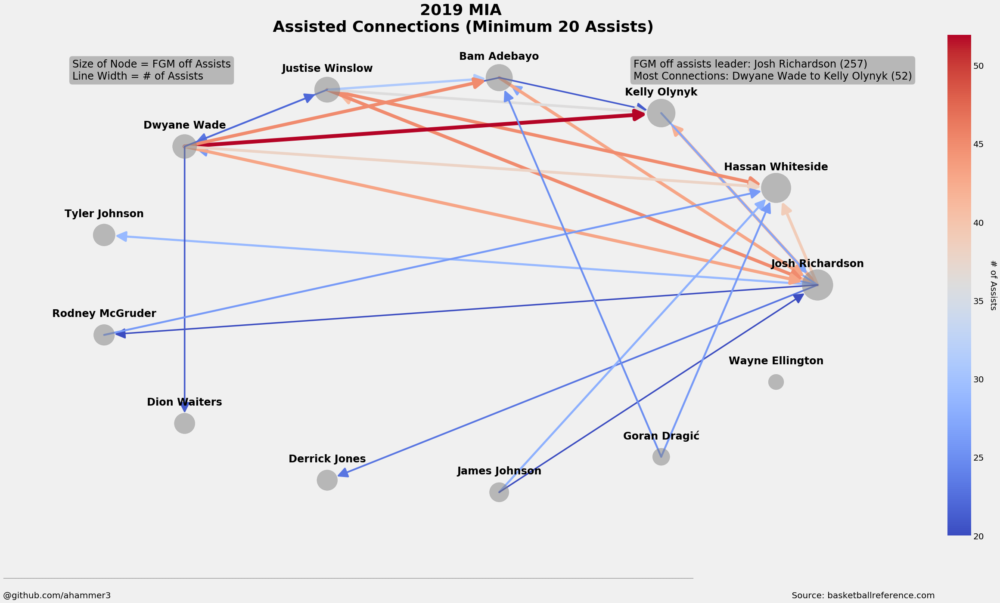

In [20]:
# let's graph our example! First make the figure, ax
fig , ax = plt.subplots(figsize=(40,20)) 

# make our network using points as nodes and assistor connections as edges
G = make_network(nodes=points.index,
               edges=[tuple(row) for row in assistor.values])

# we want a circular layout
pos = nx.layout.circular_layout(G)

# enhance the node sizes by a factor of 20 for easier viewing
node_sizes = points*20

# this is just a precaution: making the edge alpha values different so 2 edges don't overlap too much
# M = G.number_of_edges()
# edge_alphas = [(5 + i) / (M + 4) for i in range(M)]

# get our weights for edge colors
edges_list, weights = zip(*nx.get_edge_attributes(G, 'weight').items())
weights_n = list(weights)
weights_n = (weights / np.linalg.norm(weights)) * 30

# draw the nodes - grey in color
nodes = nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='grey', with_labels=True, alpha = .5,
                               ax=ax, arrows=True)

# draw the edges using our weights and a coolwarm colormap
edges = nx.draw_networkx_edges(G, pos, node_size=node_sizes,
                                   edge_color=weights,
                                   edge_cmap=plt.cm.coolwarm, width=weights_n, alpha=.1, arrowsize=50, ax=ax)

# important for labeling: we adjust the y axis value of each pos item now so the labels get printed above each node
pos = {player: [value[0], value[1]+.1] for player, value in pos.items()}

# draw the labels using the new pos 
labels = nx.draw_networkx_labels(G, pos, alpha=1, font_size=24, font_weight='bold', ax=ax)

# get a colorbar and other aesthetics
pc = mpl.collections.PatchCollection(edges, cmap=plt.cm.coolwarm)
pc.set_array(weights)
cb = plt.colorbar(pc, ax=ax)
cb.set_label("# of Assists", fontsize=20, rotation = 270, labelpad=30)
cb.ax.tick_params(labelsize=20)

# other graph essentials
plt.title("2019 {}\n Assisted Connections (Minimum 20 Assists)".format('MIA'), fontsize=36,fontweight='bold')

ax = plt.gca()
ax.set_axis_off()

# make boxes with information in them for reader
props = dict(boxstyle='round', facecolor='grey', alpha=0.5)

ax.text(0.05, 0.95, "Size of Node = FGM off Assists\nLine Width = # of Assists", transform=ax.transAxes, fontsize=24,
            verticalalignment='top', bbox=props)
ax.text(0.70, 0.95, "FGM off assists leader: {} ({})\nMost Connections: {} to {} ({})".format(points.index.to_list()[0], points.max(), assistor.iloc[0,0], assistor.iloc[0,1], assistor.iloc[0,2]), transform=ax.transAxes, fontsize=24,
            verticalalignment='top', bbox=props)

# footer 
plt.text(-1.25, -1.40, '_____________________________________________________________________________________________________________________________________________________________________________________________________________________________________', color='grey') 
plt.text(-1.25, -1.50, '@github.com/ahammer3                                                                                                                                                                                                                                                        Source: basketballreference.com', color='black', fontsize=20)

plt.show()

fig.savefig("test.png")

## Concluding Remarks

It's not the perfect looking aesthetic...but I think the information is there. It's hard to get the arrows to not overlap each other, interfere with wordings, etc. in the networkx package, but it was definitely a big improvement since my first iteration of the graph. We can see here that while Josh Richardson had the most FGM off assists at 257, the node sizes for the next 2-3 biggest players are not that far off his size, indicating that the Miami offense was at least more evenly distributed than most this season, at least on the chemistry/connection side of things, which I believe is true.

We also see that Dwyane Wade to Kelly Olynyk was on the money for most of the season as the only dark red connection (52 times). This is actually quite low compared to other teams (as you can see for yourself below), but within the scope of the Heat themselves, you can see that DWade was a key distributor in these connections, showing off his leadership skills, ball and situational awareness. (On a side note, it looks like Bam is going to replace Hassan quite well in this area.)

Lastly, it is important to note the lack of connections as well. Goran Dragic only has 2 blue lines stemming from his node, which is troubling as the team's starting Point Guard. This concern was seen in the 2019 season as well, as the Heat had struggles getting a fit here and running the point. Wayne Ellington, a node that you would think would have a lot of connections due to his spot up ability, is by itself beacause he only played in limited games this year.

Looking at these connections in a different light both confirmed what I thought about the Heat in the offseason as well as gave a few surprises (really did not think Dragic was that out of the chemistry). I had fun creating this small little visual as a proxy for team chemistry and/or connections on the court, and below I have supplied the code for all 30 teams. 

**Limitations: Some limitations that I've noticed are obviously missing information where assists included. Given the simple nature of the final dataset, unassisted FGM (goodbye James Harden's node size) are not accounted for, as well as "secondary assists" that most big men seem to have (kicking it out to the person that makes the extra pass). These are not captured, and could be on the TODO list for a more in-depth visualization later on.**

## Bonus: All 30 Teams
The code is 95% the same, really. We just run a loop through each team :)

In [21]:
# first get a list of the teams 
nba = list(df["team"].unique())
nba[0:5]

['PHI', 'BOS', 'GSW', 'OKC', 'MIL']

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

0


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

2


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

3


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

4


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

5


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

6


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

7


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

8


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

9


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

10


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

11


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

12


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

13


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

14


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

15


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

16


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

17


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

18


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable funct

19


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/

20


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/

21


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/

22


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/

23


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/

24


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/

25


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/

26


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/

27


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/

28


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/

29


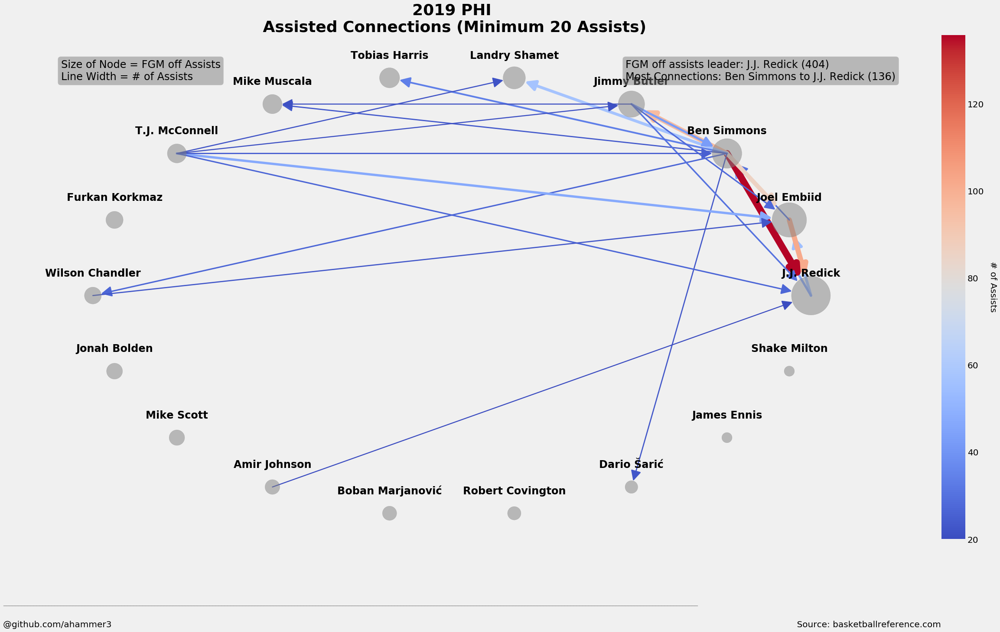

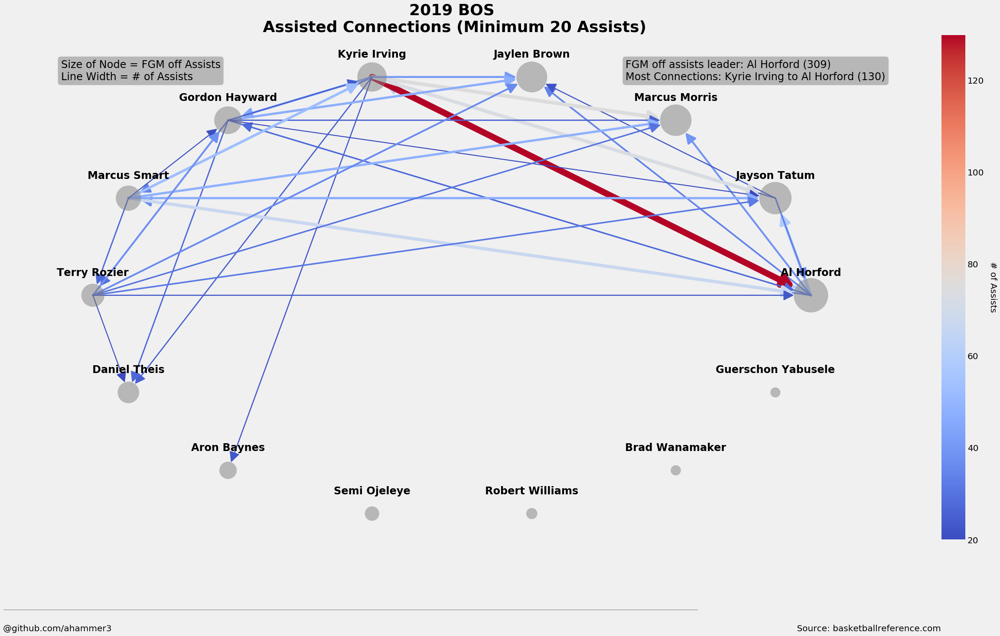

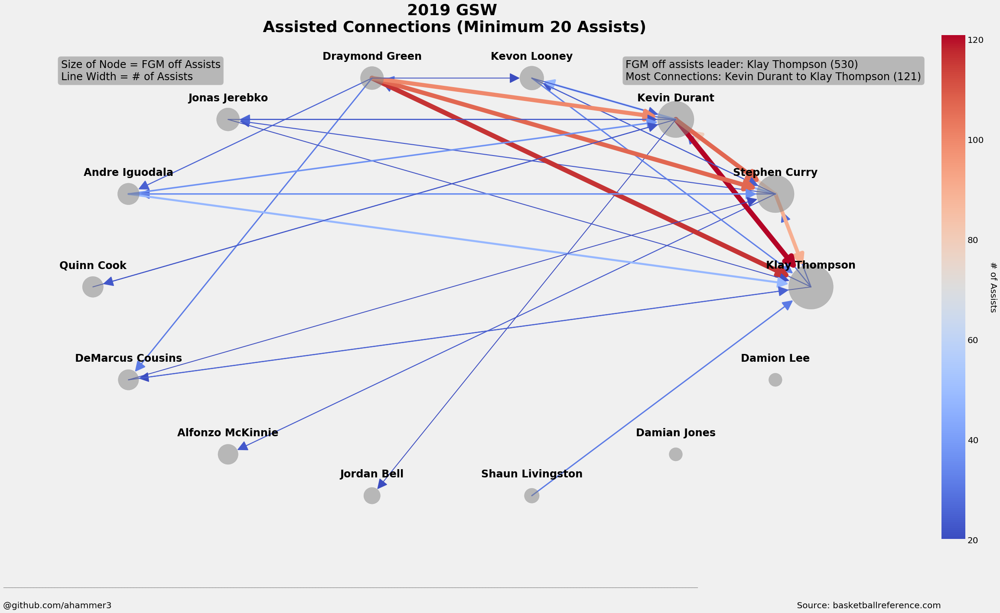

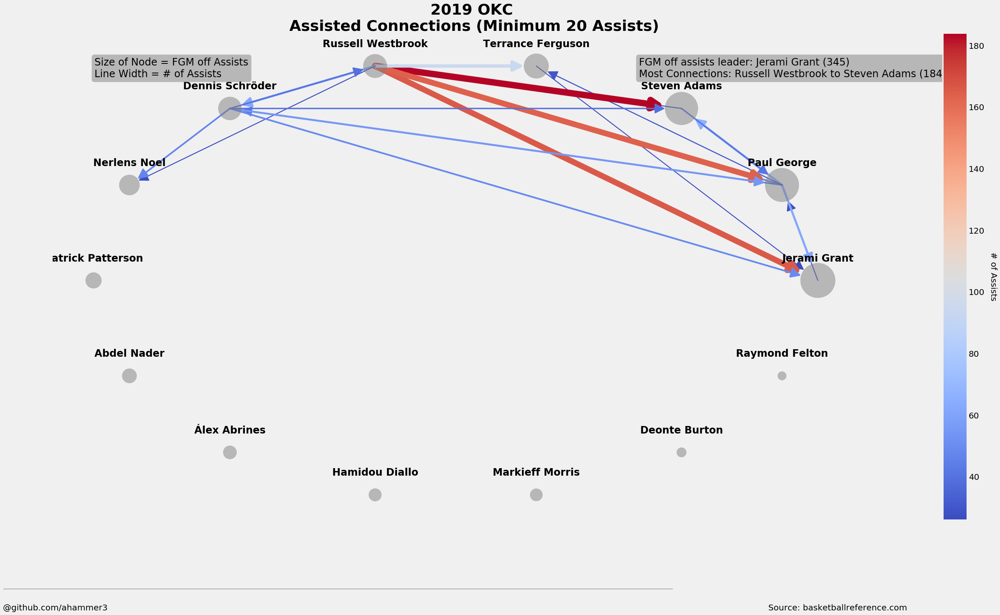

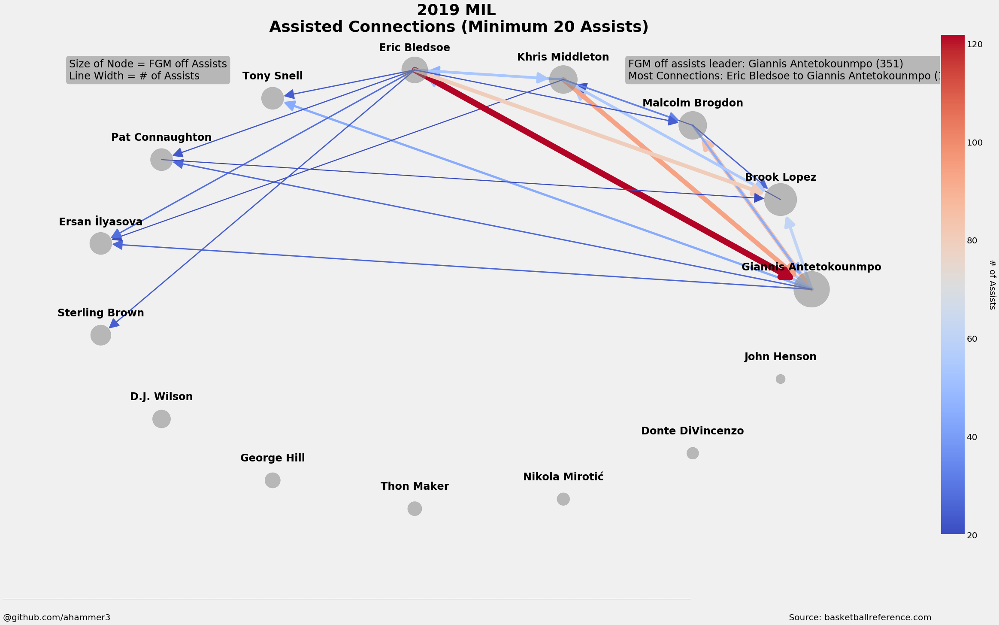

...

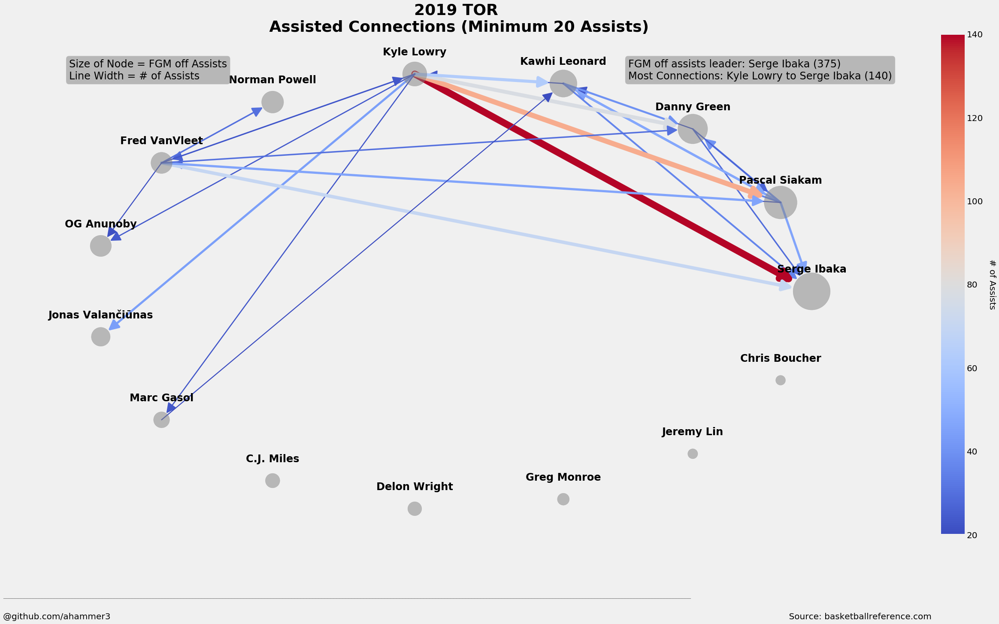

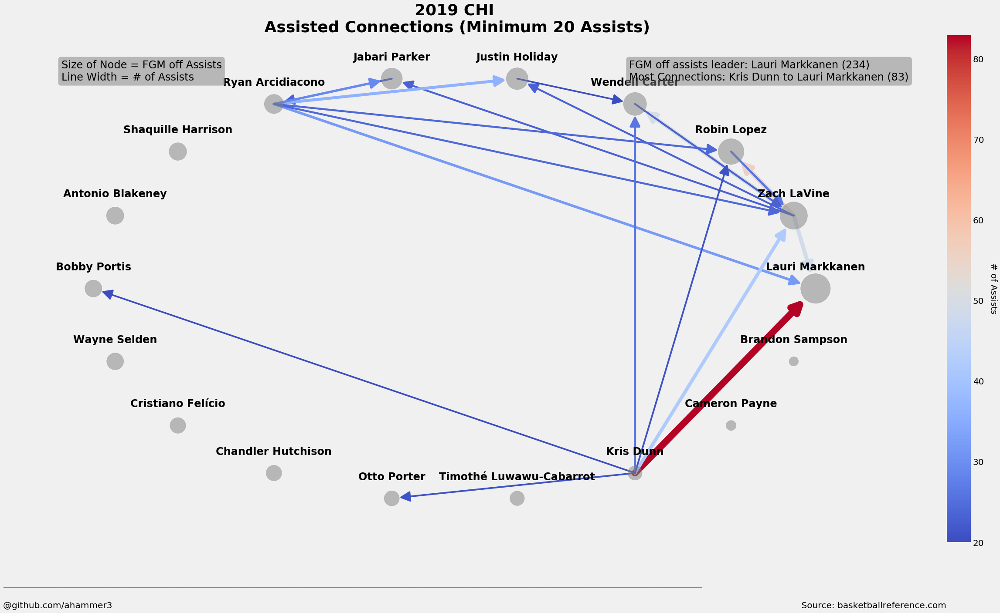

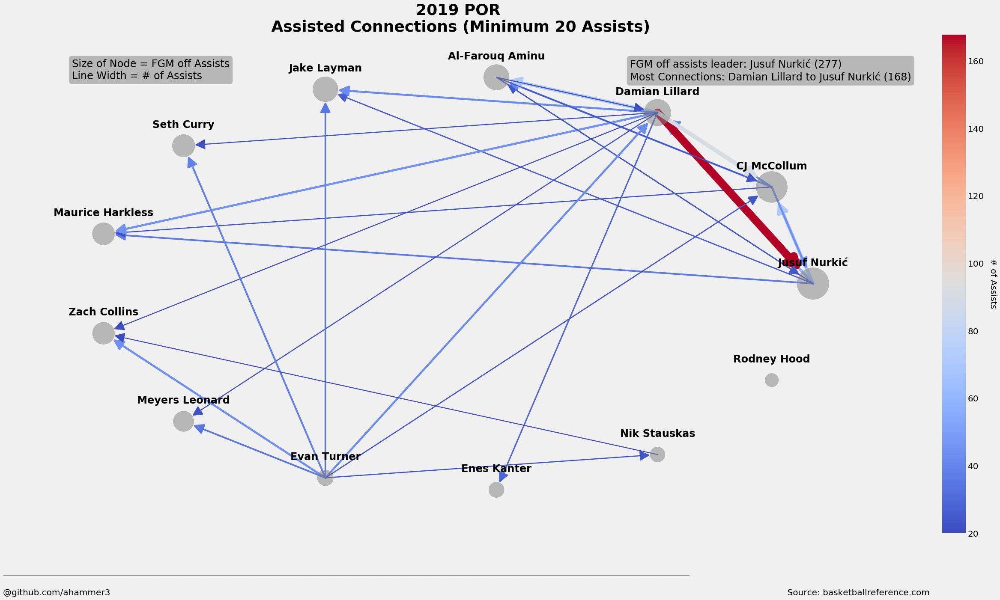

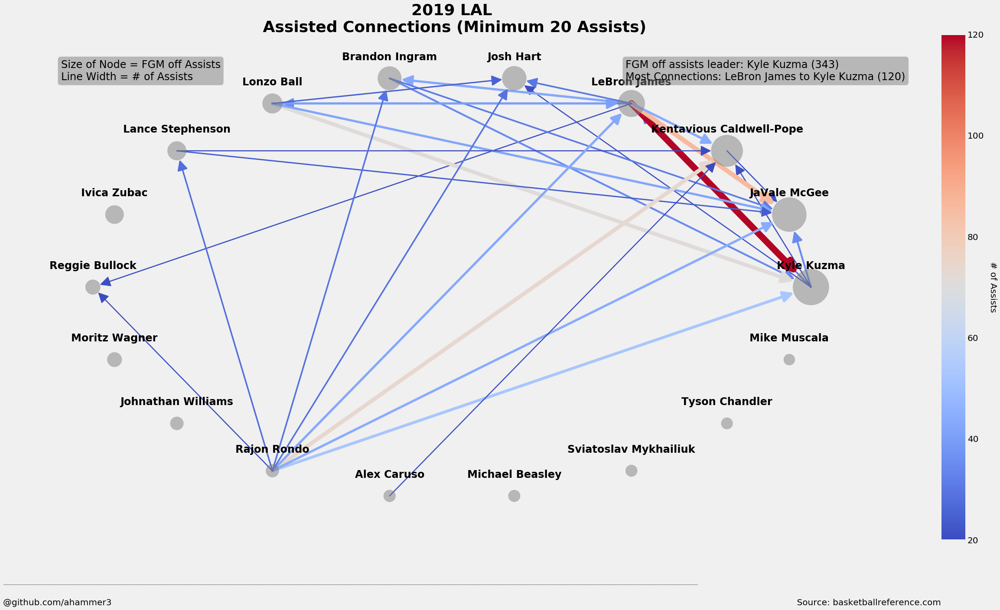

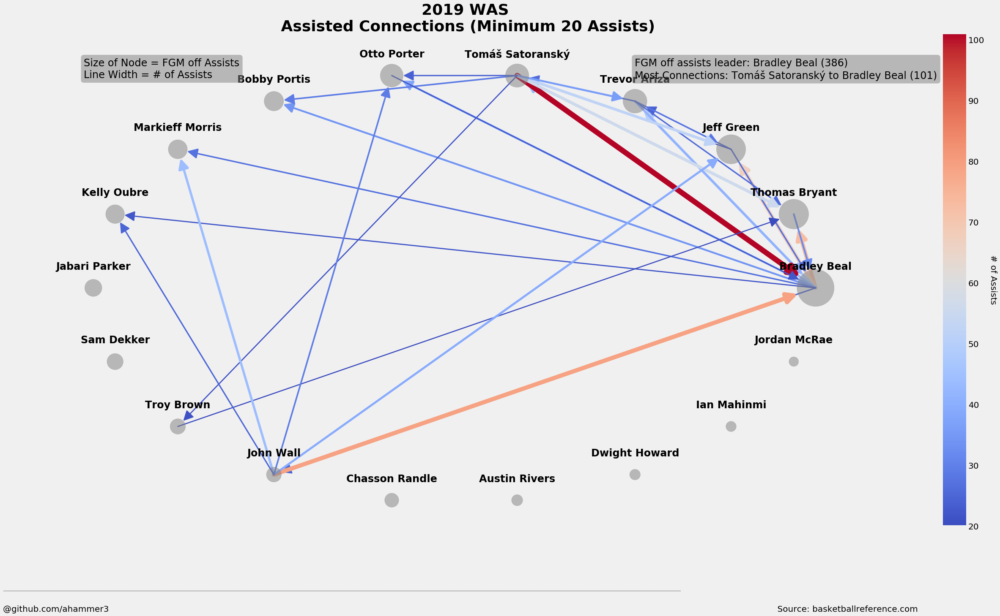

In [23]:
# this is for if you wanted one big picture...was too confusing in my opinion
# fig = plt.figure(figsize=(500,250)) 
# nrows, ncols = 10, 3

# start the loop...and repeat code...
for i in range(30):

    team = df[df["team"] == nba[i]]
    points = team["player"].value_counts()
    points = points[points > 20]

    assistor = team.drop(["team"], axis=1)
    
    keep = list(points.index)
    assistor = assistor[assistor['player'].isin(keep)]
    assistor = assistor[assistor['assist'].isin(keep)]

    assistor = assistor.groupby(assistor.columns.tolist()).size().reset_index().\
    rename(columns={0:'records'})
    assistor = assistor[assistor["records"] >= 20]
    
    assistor.sort_values(by='records', axis=0, inplace=True, ascending=False)
    
    # for one big picture
    # ax = fig.add_subplot(nrows, ncols, i+1)
    
    fig , ax = plt.subplots(figsize=(40,20)) 

    G = make_network(nodes=points.index,
                   edges=[tuple(row) for row in assistor.values])

    pos = nx.layout.circular_layout(G)

    node_sizes = points*20

    # M = G.number_of_edges()
    # edge_alphas = [(5 + i) / (M + 4) for i in range(M)]

    edges_list, weights = zip(*nx.get_edge_attributes(G, 'weight').items())
    weights_n = list(weights)
    weights_n = (weights / np.linalg.norm(weights)) * 30

    nodes = nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='grey', with_labels=True, alpha = .5,
                                   ax=ax, arrows=True)

    edges = nx.draw_networkx_edges(G, pos, node_size=node_sizes,
                                       edge_color=weights,
                                       edge_cmap=plt.cm.coolwarm, width=weights_n, alpha=.1, arrowsize=50, ax=ax)

    pos = {player: [value[0], value[1]+.1] for player, value in pos.items()}

    labels = nx.draw_networkx_labels(G, pos, alpha=1, font_size=24, font_weight='bold', ax=ax)

    pc = mpl.collections.PatchCollection(edges, cmap=plt.cm.coolwarm)
    pc.set_array(weights)
    cb = plt.colorbar(pc, ax=ax)
    cb.set_label("# of Assists", fontsize=20, rotation = 270, labelpad=30)
    cb.ax.tick_params(labelsize=20)

    plt.title("2019 {}\n Assisted Connections (Minimum 20 Assists)".format(nba[i]), fontsize=36,fontweight='bold')

    ax = plt.gca()
    ax.set_axis_off()

    props = dict(boxstyle='round', facecolor='grey', alpha=0.5)

    ax.text(0.05, 0.95, "Size of Node = FGM off Assists\nLine Width = # of Assists", transform=ax.transAxes, fontsize=24,
                verticalalignment='top', bbox=props)
    ax.text(0.70, 0.95, "FGM off assists leader: {} ({})\nMost Connections: {} to {} ({})".format(points.index.to_list()[0], points.max(), assistor.iloc[0,0], assistor.iloc[0,1], assistor.iloc[0,2]), transform=ax.transAxes, fontsize=24,
                verticalalignment='top', bbox=props)

    # footer 
    plt.text(-1.25, -1.40, '_____________________________________________________________________________________________________________________________________________________________________________________________________________________________________', color='grey') 
    plt.text(-1.25, -1.50, '@github.com/ahammer3                                                                                                                                                                                                                                                        Source: basketballreference.com', color='black', fontsize=20)
             
    # sanity while running
    print(i)

    # don't need this when just making pics
    # plt.show()
    
    fig.savefig("2019_{}.png".format(nba[i]))
    
    # uncomment this when just making pics - will not show in the output
    # plt.close()
             
#test             
#weights_n

## References and Helpful Links Used
1) https://towardsdatascience.com/web-scraping-nba-stats-4b4f8c525994 (web scraping)
    * 1b) I really liked this one for R users (https://statisticaloddsandends.wordpress.com/2018/12/11/scraping-nba-game-data-from-basketball-reference-com/)
    
2) https://medium.com/@oliviercruchant/python-networkx-graph-magic-260309cce484 (really helped me understand networkx)

3) https://networkx.github.io/documentation/stable/auto_examples/drawing/plot_directed.html (and all other networkx documentation - seriously, you'll need it)

4) https://stackoverflow.com/questions/22967086/colouring-edges-by-weight-in-networkx (another helpful networkx example)

5) https://www.dataquest.io/blog/making-538-plots/ (general aesthetic tips)

6) https://squared2020.com/2017/10/10/evaluating-assists-with-python-community-detection-and-the-brooklyn-nets/, along with many, many other random posts and sites: inspiration for the project